## This is the Aizawa Attractor

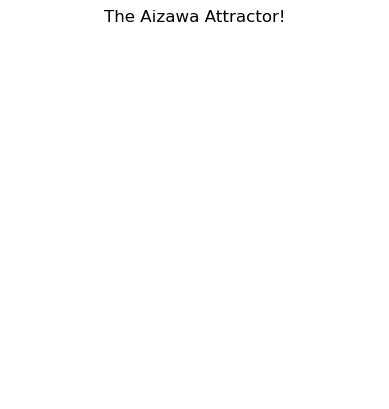

In [1]:
import matplotlib.pyplot as plt
import numpy as np
from mpl_toolkits.mplot3d import axes3d
import matplotlib.animation as animation
import IPython

# This function contains the differential equations that define the Aizawa Attractor
def aizawa(x, y, z, a=0.95, b=0.7, c=0.6, d=3.5, e=0.25, f=0.1):
    dx = (z-b)*x - d*y
    dy = (z-b)*y + d*x
    dz = c + a*z - (1/3)*(z**3) - (x**2 + y**2)*(1 + e*z) + f*z*(x**3)
    return dx, dy, dz

dt = 0.01
num_steps = 15000 # Changing this number changes how long the attractor runs for
x1, y1, z1 = 0.5, 0., 0. # Starting positions for two points, which will take different paths due to their different positions
x2, y2, z2 = 0.1, 0., 0.
x1_new, y1_new, z1_new = 0, 0, 0
x2_new, y2_new, z2_new = 0, 0, 0
x1_list, y1_list, z1_list = [x1], [y1], [z1]
x2_list, y2_list, z2_list = [x2], [y2], [z2]

for i in range (num_steps):
    if i > 100:
        dx1, dy1, dz1 = aizawa(x1, y1, z1) # Creating lists containing the position coordinates of point1
        x1_new = x1 + (dx1 * dt) # Euler's Method
        y1_new = y1 + (dy1 * dt)
        z1_new = z1 + (dz1 * dt)
        x1_list.append(x1_new)
        y1_list.append(y1_new)
        z1_list.append(z1_new)
        x1, y1, z1 = x1_new, y1_new, z1_new
        dx2, dy2, dz2 = aizawa(x2, y2, z2) # Creating lists containing the position coordinates of point2
        x2_new = x2 + (dx2 * dt) # Euler's Method
        y2_new = y2 + (dy2 * dt)
        z2_new = z2 + (dz2 * dt)
        x2_list.append(x2_new)
        y2_list.append(y2_new)
        z2_list.append(z2_new)
        x2, y2, z2 = x2_new, y2_new, z2_new

# Create figure
fig = plt.figure()
ax = fig.add_subplot(projection = "3d")

aizawa_plot1, = plt.plot(x1_list, y1_list, z1_list, lw = 0.5, color = "darkblue")
aizawa_plot2, = plt.plot(x2_list, y2_list, z2_list, lw = 0.5, color = "green")

# This function is to be iterated to make an animation of the evolution of the dynamical system
def update_frame_and_rotate(frame):
    frame = frame*150 # Changing the number here allows more points to be plotted in the animation, though it will move faster
    x_frame = [x1_list[0:frame+1], x2_list[0:frame+1]]
    y_frame = [y1_list[0:frame+1], y2_list[0:frame+1]]
    z_frame = [z1_list[0:frame+1], z2_list[0:frame+1]]

    aizawa_plot1.set_data(x_frame[0], y_frame[0])
    aizawa_plot1.set_3d_properties(z_frame[0])
    aizawa_plot2.set_data(x_frame[1], y_frame[1])
    aizawa_plot2.set_3d_properties(z_frame[1])
    
    # Rotation
    elev = 30
    azim = 100
    roll = 0
    azim = azim + frame/12 # Divisor controls spinning speed. Making this divisible by the number of frames makes for smooth repetition
    ax.view_init(elev, azim)
    return aizawa_plot1,

ax.set_axis_off() # This does all that the below ax lines do + it removes the axes
# ax.grid(False)
# ax.xaxis.pane.set_edgecolor('white')
# ax.yaxis.pane.set_edgecolor('white')
# ax.zaxis.pane.set_edgecolor('white')
# ax.xaxis.pane.fill = False
# ax.yaxis.pane.fill = False
# ax.zaxis.pane.fill = False
# plt.plot(x1_list, y1_list, z1_list, lw = 0.5, color = "gold")
# plt.plot(x2_list, y2_list, z2_list, lw = 0.5, color = "green")
plt.xlabel("x")
plt.ylabel("y")
plt.title("The Aizawa Attractor!")

anim = animation.FuncAnimation(fig, update_frame_and_rotate, frames=72, interval=90, blit=False)
#plt.show()
IPython.display.HTML(anim.to_jshtml())

## This is the Lorenz Attractor

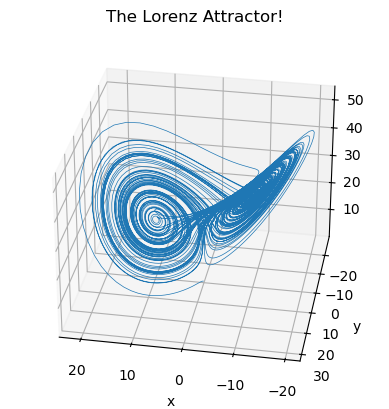

In [69]:
import matplotlib.pyplot as plt
import numpy as np
from mpl_toolkits.mplot3d import axes3d
import matplotlib.animation as animation
import IPython


def lorenz(x, y, z, s=10, r=28, b=2.667):
    dx = s * (y-x)
    dy = x * (r-z) - y
    dz = x*y - b*z
    return dx, dy, dz

dt = 0.01
num_steps = 10000
x, y, z = 0., 1., 1.05
x_new, y_new, z_new = 0, 0, 0
x_list, y_list, z_list = [x], [y], [z]

for i in range (num_steps):
    if i > 100:
        dx, dy, dz = lorenz(x, y, z)
        x_new = x + (dx * dt)
        y_new = y + (dy * dt)
        z_new = z + (dz * dt)
        x_list.append(x_new)
        y_list.append(y_new)
        z_list.append(z_new)
        x, y, z = x_new, y_new, z_new


fig = plt.figure()
ax = fig.add_subplot(projection = "3d")
plt.plot(x_list, y_list, z_list, lw = 0.5)
plt.xlabel("x")
plt.ylabel("y")
plt.title("The Lorenz Attractor!")

elev = 30
azim = 100
roll = 0
ax.view_init(elev, azim, roll)


def rotate(x):
    azim = 100
    for i in range(90):
        elev = 30
        azim = azim + x/12
        roll = 0
        ax.view_init(elev, azim=azim)

anim = animation.FuncAnimation(fig, rotate, frames=48, interval=50, blit=False)
IPython.display.HTML(anim.to_jshtml())

Sources:
https://dawes.wordpress.com/2014/06/27/publication-ready-3d-figures-from-matplotlib/
https://youtu.be/GdNjTJZnTmM?feature=shared
https://youtu.be/wFpQ0fiMGeI?feature=shared
https://scipython.com/blog/the-lorenz-attractor/


Recommended Reading:
https://youtu.be/fDek6cYijxI?feature=shared
https://youtu.be/uzJXeluCKMs?feature=shared
https://medium.com/@lucpiz/python-complex-systems-chaos-and-lorenz-attractor-28499de3f36a
https://paulbourke.net/fractals/lorenz/
https://paulbourke.net/fractals/lyapunov/
https://youtu.be/Lw_SqFxHtH0?feature=shared
https://sprott.physics.wisc.edu/pubs/paper203.pdf